## Homework 3

## <em> Bayesian Statistics, Numerical Differentiation, and Optimization Methods</em>
<br>

Homework Guidelines:

1) Document your code! Only part of your score on the homework will be if you get the "right" answer. In order for us to understand what you've written, you need to have clearly written code. Documenting your code with comments (# sign) and spacing out your code (but not too much) makes it easier to read. You should also make use of the markdown feature of ipython notebooks for longer explanations or to imbed pictures/formulas.

2) You may google around for tools for solving the homework problems (StackExchange will often pop up!) but DO NOT google the exact problem statement or copy blocks of code from elsewhere.

3) You can work in small groups to complete assignments and share code within the small group. Please specify who you worked with if your submitted solutions are similar/identical.

4) Various python packages have built in routines for common programming tasks. If you want to use an external (i.e. import X) package which isn't imported in the problem statement please ask the instructor first.

5) Some problem statements might be vague or unspecific (like "Explore the relationship between X and Y"), just like real research questions! When in doubt it would be useful to provide plots and your observations. Show what you did graphically whenever possible.

6) Run all cells before you commit!


<em>Hit "Shift-Enter" on a code cell to evaluate it.  Double click a Markdown cell to edit. </em><br>

## Problem 1 - A Trip to Yosemite (10 Points)

You take a trip to Yosemite Valley and you see 4 bears, 2 eagles, and 1931 tourists. 

a) Assuming that our sample is representative, estimate the prevalence of each species in the Yosemite ecosystem numerically. (Hint, it is similar to our avocado question!)

In [1]:
Species = {"bear" : 4, "eagle" : 2, "tourist" : 1931} 

# calculate the priori
bear_priori = Species["bear"] / sum(list(Species.values()))
eagle_priori = Species["eagle"] / sum(list(Species.values()))
tourist_priori = Species["tourist"] / sum(list(Species.values()))

print(bear_priori, eagle_priori, tourist_priori)

0.002065049044914817 0.0010325245224574084 0.9969024264326277


b) Of course, your sample isn't very representative as you only visited Yosemite Valley, which holds 99% of all the tourists (Although it is representative of the bears and eagles). Below is a map of Yosemite. Use it to update your posterior on number the overall number density of bears, eagles and tourists in Yosemite.


Hint; You can use the color information to create filters to figure out how many pixels are in Yosemite Valley (the green area). You can also use the grid lines to estimate how many pixels are outside the border of Yosemite (the black outline); this can be a very rough estimate.


## My thought before doing this pro
In fact, the most difficult part of this question is that how to calculate the pixels are in the green area & how to calculate the pixels in the outline (the border of Yosemite).
If we know the number of pixels in the green area is m, and the number of pixels in the outline is n.
Then we can use the following function to calculate the number of bears, eagles, tourists in Yosemite.
$$total\_bear = \frac{Species["bear"] \times n}{m}$$
$$total\_eagle = \frac{Species["eagle"] \times n}{m}$$
$$total\_tourist = \frac{Species["tourist"]}{99\%} $$
Finally, we calculate the partition of all three species.

Populating the interactive namespace from numpy and matplotlib


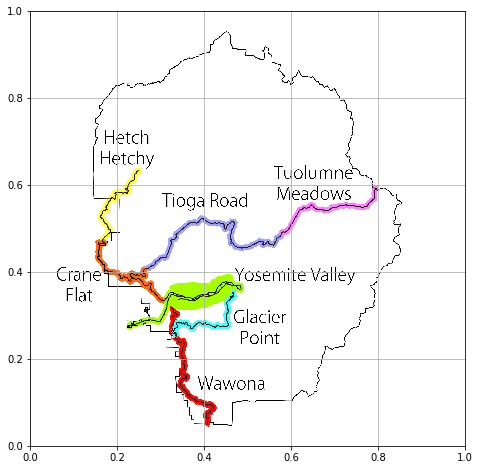

In [2]:
import matplotlib.image as mpimg

%pylab inline

plt.figure(figsize = (8, 8))


img = mpimg.imread("Yosemite-Regions.png")
# after printing a lot of pixel I have finally get the point 
plt.imshow(img[:,:],zorder=0, extent=[0, 1.0, 0, 1.0])
# x_tick = y_tick = np.linspace(0, 1, 41)
# plt.xticks(x_tick, x_tick)
# plt.yticks(y_tick, y_tick)
plt.grid()


In [3]:
import numpy as np

In [4]:
# we want to know which kinds of array represent the green color best.
# so we sample some different array from the graph to plot them to get the ans.
test_color_1 = np.array([0.99215686,0.99215686, 0.99215686, 1.] * 2500 * 2500).reshape(2500, 2500, 4)
test_color_2 = np.array([0.01568628,0.01568628, 0.01568628, 1.] * 2500 * 2500).reshape(2500, 2500, 4)
test_color_3 = np.array([0.97647059, 0.50980395, 0.97254902, 1.] * 2500 * 2500).reshape(2500, 2500, 4)
test_color_4 = np.array([0.64705884, 1.        , 0 , 1.] * 2500 * 2500).reshape(2500, 2500, 4)

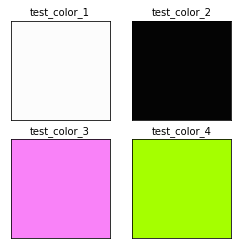

In [6]:
#we plot them and then we find our answer. 

fig = plt.figure(figsize=(4,4))
plt.subplots_adjust(wspace=0.2, hspace=0.2)
ax1 = plt.subplot(221)
ax1.set_title("test_color_1", fontsize = 10)
plt.xticks([]); plt.yticks([])
plt.imshow(test_color_1,zorder=0, extent=[0, 1.0, 0, 1.0])
ax2 = plt.subplot(222)
ax2.set_title("test_color_2", fontsize = 10)
plt.xticks([]); plt.yticks([])
plt.imshow(test_color_2,zorder=0, extent=[0, 1.0, 0, 1.0])
ax3 = plt.subplot(223)
ax3.set_title("test_color_3", fontsize = 10)
plt.xticks([]); plt.yticks([])
plt.imshow(test_color_3,zorder=0, extent=[0, 1.0, 0, 1.0])
ax4 = plt.subplot(224)
ax4.set_title("test_color_4", fontsize = 10)
plt.xticks([]); plt.yticks([])
plt.imshow(test_color_4,zorder=0, extent=[0, 1.0, 0, 1.0])

In [7]:
img_selected = []
for i in abs(img - 0.64705884) < 0.010:
    for j in i:
        if(j[0] == True):
            img_selected.append([0.64705884, 1.        , 0 , 1.])
        else:
            img_selected.append([0,0,0,0])

In [8]:
img_selected = np.array(img_selected).reshape(2500, 2500, 4)

Populating the interactive namespace from numpy and matplotlib


<Figure size 432x288 with 0 Axes>

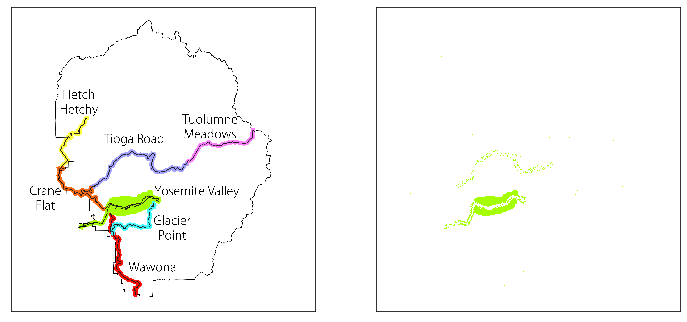

<Figure size 432x288 with 0 Axes>

In [9]:
%pylab inline
fig = plt.figure(figsize = (12,6))
ax1 = plt.subplot(121)
plt.imshow(img[:,:],zorder=0, extent=[0, 1.0, 0, 1.0])
ax1.set_xticks([]); ax1.set_yticks([])

ax2 = plt.subplot(122, sharey = ax1)
plt.imshow(img_selected, zorder=0, extent=[0, 1.0, 0, 1.0])
ax2.set_xticks([])
plt.figure()

In [10]:
# Through the demonstration in the above figure, we have successfully obtained 
# the part of the green area in the figure. We can approximate that the number of
# pixels that are filtered out in this part is the number of pixels in the whole area.

green_area_partition = np.mean(abs(img - 0.64705884) < 0.010) * 4
print(green_area_partition)


0.01024224


to count the number of grid within the border of the outline, we split the graph into smaller units ($40\times 40$), each unit occupies $1/1600$ of the whole graph.

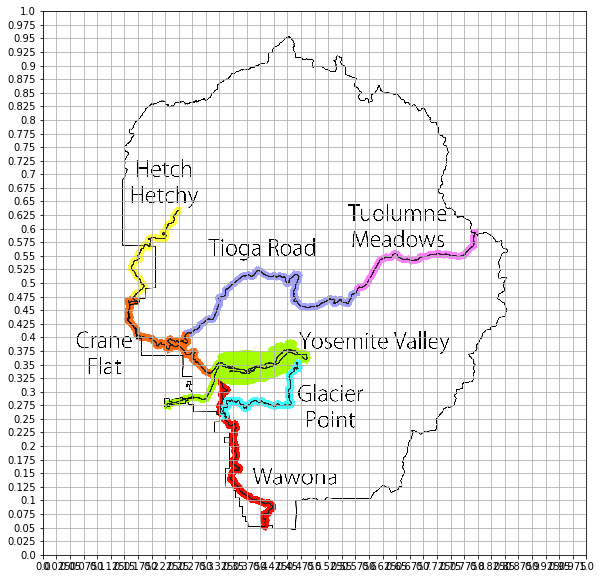

In [11]:
fig = plt.figure(figsize=(10,10))
plt.imshow(img[:,:],zorder=0, extent=[0, 1.0, 0, 1.0])
x_tick = y_tick = np.linspace(0, 1, 41)
plt.xticks(x_tick, x_tick)
plt.yticks(y_tick, y_tick)
plt.grid()

after counting the unit carefully, the result is there are about 662 units(total 1600 units), Yosemite occupies 662/1600 of this image, ie ($\frac{662}{1600} \times 2500$ pixels)

In [12]:
Yosemite_Valley_area = 2500 * green_area_partition
Yosemite_area = 2500 * 662 / 1600

total_bear = Species["bear"] * Yosemite_area / Yosemite_Valley_area
total_eagle = Species["eagle"] * Yosemite_area / Yosemite_Valley_area
total_tourist = Species["tourist"] * 100 / 99

Species_posterior = {"bear":total_bear, "eagle":total_eagle, "tourist":total_tourist}

bear_posterior = Species_posterior["bear"] / sum(list(Species_posterior.values()))
eagle_posterior = Species_posterior["eagle"] / sum(list(Species_posterior.values()))
tourist_posterior = Species_posterior["tourist"] / sum(list(Species_posterior.values()))

# finally we can calculate our answer.
print(bear_posterior, eagle_posterior, tourist_posterior)

0.0736864198585 0.0368432099292 0.889470370212


## Problem 2 - Biased Coin (10 Points)

(From Uros Seljak)

When spun on edge 256 times, a Belgian one-euro coin came up heads 142 times and tails 114. Do these data give evidence that the coin is biased rather than fair? <br>
<br>
We compare the models $\mathcal{H}_0$ - the coin is fair - and $\mathcal{H}_1$ - the coin is biased. <br>
<br>
First, suppose that the model $\mathcal{H}_1$ assumes a uniform prior distribution for $p$ (the probability of getting heads in a single toss): $P(p|\mathcal{H}_1) = 1$. <br>
<br>
Let the data $D$ be a sequence which contains counts of the two possible outcomes (H - head / T - tail): e.g. HHTHT, HHHTTHTT, etc. <br>
<br>
Given a particular $p$, the probability that $F$ tosses results in a sequence $D$ of $F_H$ heads and $F_T$ tails is:
$$ P(D|p,\mathcal{H}_1) = p^{F_H} (1-p)^{F_T}. $$
<br>
Then,
$$ P(D|\mathcal{H}_1) = \int_0^1 dp\ p^{F_H} (1-p)^{F_T} = \frac{\Gamma(F_H+1)\Gamma(F_T+1)}{\Gamma(F_H+F_T+2)} .$$
Note that the above integral is a "Beta function" $B(F_H+1, F_T+1)$ and can be written in terms of the gamma function. (See http://www.math.uah.edu/stat/special/Beta.html) <br>
<br>
The gamma function is an extension of the factorial function $\Gamma(n+1) = n!$ <br> <br>
$$ \frac{\Gamma(F_H+1)\Gamma(F_T+1)}{\Gamma(F_H+F_T+2)} = \frac{F_H! F_T!}{(F_H+F_T+1)!} $$
<br>
Similarly,
$$ P(D|\mathcal{H}_0) = \big(\frac{1}{2}\big)^F. $$
<br>


 a) Find the likelihood ratio $\frac{P(D|\mathcal{H}_1)}{P(D|\mathcal{H}_0)}$, assuming the uniform prior of $\mathcal{H}_1$. Which model does the data favor? <br>
<br>
(Hint: If the argument of the gamma function is large, math.gamma() overflows. You can prevent this by using the fact:
$$ log(xy/z) = log(x)+log(y)-log(z) $$ <br>
Then, you can evaluate $P = \Gamma(x)*\Gamma(y)/\Gamma(z)$ in the following way:
$$ Q = log(P) = log(\Gamma(x))+log(\Gamma(y))-log(\Gamma(z)) $$
$$ P = e^Q $$
<br>
You can easily evaluate logarithm of the gamma function using "lgamma" (from math import lgamma) see https://docs.python.org/2/library/math.html)<br>
<br>
(Hint2: For reference, you can read: https://en.wikipedia.org/wiki/Bayes_factor)

In [13]:
F = 256; F_H = 142; F_T = F - F_H

from math import factorial, log, exp, lgamma

Likelihood_H1 = np.e ** (lgamma(F_H + 1) + lgamma(F_T + 1) - lgamma(F + 1))
Likelihood_H0 = (1/2) ** 256

ratio = Likelihood_H1 / Likelihood_H0

print("The likelihood ratio is = ", ratio)
print("The data give evidence in favor of {}".format("H1" if ratio > 1 else "H0"))

The likelihood ratio is =  92.54292787430053
The data give evidence in favor of H1


Instead of assuming a uniform prior, suppose that we add a small bias, and consequently the prior were presciently set: <br>
$$ P(p|\mathcal{H}_1, \alpha) = \frac{1}{Z(\alpha)}p^{\alpha-1}(1-p)^{\alpha-1},\ \  \mathrm{where}\ \ Z(\alpha) = \Gamma(\alpha)^2/\Gamma(2\alpha) $$
<br>
b) Find the likelihood ratio $\frac{P(D|\mathcal{H}_1)}{P(D|\mathcal{H}_0)}$, assuming the above prior of $\mathcal{H}_1$. Let $\alpha$ = \{ .37, 1.0, 2.7, 7.4, 20, 55, 148, 403, 1096 \}. 


## My thought before doing this pro 
The difficult Part of this pro is to deal with the formula, and how to calculate the complex integral.
$$\begin{eqnarray}
P(D|H_1) & = & \int_{0}^{1} P(p|H_1, \alpha) \times P(D|p,H_1)dp \\
& = &\int_{0}^{1} \frac{1}{Z(\alpha)}p^{\alpha-1}(1-p)^{\alpha-1} \times p^{F_H} (1-p)^{F_T}dp \\
\end{eqnarray}$$
Then merge similar items for simplification.
$$\begin{eqnarray}
& = & \frac{1}{Z(\alpha)} \int_{0}^{1} p^{\alpha-1+F_H}(1-p)^{\alpha-1+F_T}dp 
\\
& = & \frac{1}{Z(\alpha)} \times \frac{\Gamma(\alpha+F_H)\Gamma(\alpha+F_T)}{\Gamma(F_H+F_T+2\alpha)} \\
\end{eqnarray}$$
Finally, we get the formular, as follows:
$$ = \frac{\Gamma(2\alpha)\Gamma(\alpha+F_H)\Gamma(\alpha+F_T)}{\Gamma(\alpha)^2\Gamma(F_H+F_T+2\alpha)}$$

In [14]:
alpha = np.array([0.37, 1.0, 2.7, 7.4, 20, 55, 148, 403, 1096])

def likelihood_ratio(F_H, F_T, alpha):
    likelihood_h0 = (1/2) ** 256
    likelihood_h1 = e ** (lgamma(2*alpha) + lgamma(alpha + F_H) + lgamma(alpha + F_T) 
                          - lgamma(2 * alpha + F_H + F_T) - 2 * lgamma(alpha)) 
    return likelihood_h1 / likelihood_h0

ratio = np.zeros_like(alpha)

for i in range(len(alpha)):
    ratio[i] = likelihood_ratio(F_H, F_T, alpha[i])

print("For alpha = ", alpha)
print("The likelihood ratios are = ", np.around(ratio, decimals=2), "respectively.")

For alpha =  [  3.70000000e-01   1.00000000e+00   2.70000000e+00   7.40000000e+00
   2.00000000e+01   5.50000000e+01   1.48000000e+02   4.03000000e+02
   1.09600000e+03]
The likelihood ratios are =  [ 0.19  0.36  0.62  0.99  1.38  1.6   1.49  1.26  1.11] respectively.


## Problem 3 - Optimization or Random Sampling (15 Points)

In lecture we found the optimal point for the noisy simple harmonic oscillator dataset using a markov chain monte carlo method. In this assignment, we will perform the similar optimization using a simple gradient descent algorithm.

Recall that gradient descent uses the gradient information to 'roll down the hill' towards the correct solution. (Look back at lecture 4 on day 5 for a simple example)


a) Plot the data and best fit line from ./hooks_law.txt. Remember to make your plot pretty!

Populating the interactive namespace from numpy and matplotlib


/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['log', 'exp']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


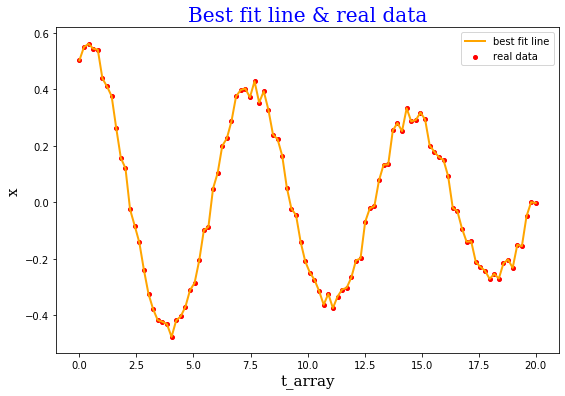

In [15]:
%pylab inline
d_out = np.genfromtxt("./hooks_law.txt")

#your plotting here!
font_title = {'family': 'serif',
        'color':  'blue',
        'weight': 'normal',
        'size': 20,
        }
font_legend = {'family': 'serif',
        'color':  'black',
        'weight': 'normal',
        'size': 15,
        }

fig = plt.figure(figsize=(9,6))
plt.title("Best fit line & real data", fontdict=font_title)
plt.scatter(d_out[:, 0], d_out[:, 1], s = 16, color = 'r', label = 'real data')
plt.plot(d_out[:, 0], d_out[:, 1], label = 'best fit line', color = 'orange',linewidth = 2)
plt.xlabel(r"t_array", fontdict=font_legend)
plt.ylabel(r"x" , fontdict=font_legend)
plt.legend()


b) Implement a simple first order method to find the optimal parameters given a random starting location. Use the below chi-squared formula. 

$\chi^2 = \sum_i (\bar{n}_i-n_i)^2/\sigma$

(Hint: you can treat all 3 free parameters (x_0, k, b) as independent directions, but you must optimize them all at the same time)

In [16]:
def chi_squared(data, parameter_guess):
    x_0, v_0, k, b, m = parameter_guess
    t_array = data[:,0]
    x_experiment = data[:,1]
    x_guess = np.array([true_motion(t,x_0,v_0,k,b,m) for t in t_array])
    
    chi_squared = np.power((x_guess - x_experiment),2)/0.04
    
    return np.sum(chi_squared)

def true_motion(t,x_0,v_0,k,b,m):
    w0 = sqrt(k/m)
    b0 = b/m
    
    if b0**2.-4.*w0**2.>0:
        raise NameError("Not underdamped system! "+ str(b0**2.-4.*w0**2.) )
        
    gamma = 1/2. *sqrt(4*w0**2. - b0**2.)
    
    A = x_0
    B = v_0 + 1/2.*gamma*x_0
    return (A*cos(t*gamma)+B*sin(t*gamma))*exp(-b0*t/m)


# true values (to compare to in the end)
k = 8.25 # spring constant
sigma_x = 0.04 # uncertainty in the x measurement
x_0 = 0.5 # staring position
v_0 = 0.0 # starting velocity
b = 4. # damping
m = 10. # mass

In [17]:
def Derivative(parameter_guess, func=chi_squared, method = 'left', h = 0.00001):
    '''
        @aim : to calcultate the partial vector
        @param : parameter_guess : the point we want to calculate
        @param : func : the function we want to calculate
        @param : method : three possible way (left, right, middle)
        @param : h : finite differences
    '''
    if method == 'left':
        h_list = np.eye(len(parameter_guess)) * h
        return np.array([(func(d_out, parameter_guess + h_list[n]) - func(d_out, parameter_guess)) / h
            for n,_ in enumerate(parameter_guess)])
    elif method == 'right':
        h_list = np.eye(len(parameter_guess)) * h
        return np.array([(func(d_out, parameter_guess) - func(d_out, parameter_guess - h_list[n])) / h
            for n,_ in enumerate(parameter_guess)])
    elif method == 'middle':
        h_list = np.eye(len(parameter_guess)) * h / 2
        return np.array([(func(d_out, parameter_guess + h_list[n]) - func(d_out, parameter_guess - h_list[n])) / h
            for n,_ in enumerate(parameter_guess)])

In [38]:
point_array_first_order = []
chi_squared_first_order = []
initial_param = [1, 0, 7, 3, 10]
best_param = initial_param
min_chi = chi_squared(d_out, best_param)
def Gradient_descent_opt(parameter_guess, learning_rate = 0.001, epoch = 10000):
    # initialize the data...
    best_param = parameter_guess
    best_chi = chi_squared(d_out, best_param)
    # main loop
    for i in range(epoch):
        # do some changes
        deta = Derivative(parameter_guess)
        deta[1] = deta[4] = 0
        # to add some noise to overcome the local optimum
        random_noise = np.random.random(5) * 0.01 - 0.005
        random_noise[1] = random_noise[4] = 0
        parameter_guess -= (learning_rate * deta + random_noise)
        
        # if better record it.
        if(chi_squared(d_out, parameter_guess) < best_chi):
            best_chi = chi_squared(d_out, parameter_guess)
            best_param = parameter_guess
            
        # print & record some of the result
        if(i % 100 == 0):
            print(chi_squared(d_out, parameter_guess), parameter_guess)
            point_array_first_order.append(parameter_guess)
            chi_squared_first_order.append(chi_squared(d_out, parameter_guess))
        # Determine if it has converged
        if len(chi_squared_first_order) >= 5 and np.std(chi_squared_first_order[-5:], ddof=1) < 0.01:
            print("has already converged!\n", best_chi, best_param)
            break
    return best_chi, best_param

In [39]:
min_chi_first_order , best_param_first_order = Gradient_descent_opt(initial_param)

268.19607307 [ -0.0837519    0.           7.19204659   3.0688742   10.        ]
1.79639788765 [  0.47275886   0.           8.12628982   3.16771038  10.        ]
1.80459435817 [  0.46529504   0.           8.13120568   3.28489759  10.        ]
1.67224573414 [  0.47219015   0.           8.15349227   3.32676869  10.        ]
1.60889918434 [  0.48060532   0.           8.15446324   3.36723032  10.        ]
1.55659803573 [  0.48066807   0.           8.16710117   3.43471497  10.        ]
1.52754208354 [  0.48761126   0.           8.20071225   3.50333362  10.        ]
1.47217943568 [  0.48375643   0.           8.18932925   3.58666844  10.        ]
1.4257716215 [  0.49112509   0.           8.2054793    3.64959108  10.        ]
1.41290811099 [  0.48915658   0.           8.21386888   3.68119755  10.        ]
1.43361573683 [  0.49592459   0.           8.20774977   3.6776818   10.        ]
1.41705308676 [  0.49122499   0.           8.21081445   3.6658443   10.        ]
1.40871505836 [  0.49424677   

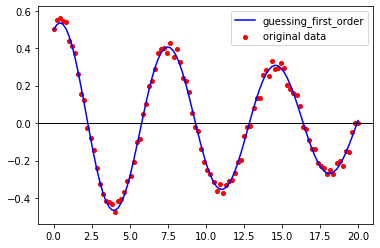

In [36]:
# to show the result of using the first order method.

t_array = np.linspace(0, 20 ,100)

plt.scatter(d_out[:, 0], d_out[:, 1], s = 16, color = 'r', label = 'original data')
plt.plot(t_array, true_motion(t_array, best_param_first_order[0], best_param_first_order[1], best_param_first_order[2], best_param_first_order[3], best_param_first_order[4] ), 'b',label = 'guessing_first_order')

plt.plot([-1, 21], [0, 0], 'black', linewidth = 1)
plt.xlim([-1, 21])
plt.legend()

c) Now, instead of a first order method, lets use a second order method (i.e. Newton's Method). Here at each iteration we update based on the following formula;

$x_{n+1} = x_{n} - \frac{f'(x_{n})}{f''(x_{n})}$

You will need to code up a second derivative calculator, like we did in class.

In [21]:
def second_derivative(parameter_guess, func = chi_squared, h = 0.0001):
    h_list = np.eye(len(parameter_guess)) * h
    return(Derivative(parameter_guess, func = func, method='left', h=h) - 
                    Derivative(parameter_guess, func = func, method='right', h=h)) / h 

In [22]:
point_array_second_order = []
chi_squared_second_order = []
def second_gradient_descent_opt(parameter_guess, learning_rate = 0.01 ,epoch = 10000):
    
    best_param = parameter_guess
    best_chi = chi_squared(d_out, best_param)
    
    for i in range(epoch):
        # do some changes 
        deta = Derivative(parameter_guess) / second_derivative(parameter_guess)
        # fix v_0 = 0 & m = 10
        deta[1], deta[4] = 0, 0
        parameter_guess -= deta * learning_rate
        
        if(chi_squared(d_out, parameter_guess) < best_chi):
            best_chi = chi_squared(d_out, parameter_guess)
            best_param = parameter_guess
            
        # print & record some of the result
        if(i % 100 == 0):
            print(chi_squared(d_out, parameter_guess), parameter_guess)
            point_array_second_order.append(parameter_guess)
            chi_squared_second_order.append(chi_squared(d_out, parameter_guess))
        
        # Determine if it has converged
        if len(chi_squared_second_order) >= 5 and np.std(chi_squared_second_order[-5:], ddof=1) < 0.01:
            print("has already converged!\n", best_chi, best_param)
            break
    return best_chi, best_param

In [26]:
min_chi_second_order, best_param_second_order = second_gradient_descent_opt(initial_param)

369.40297461 [  0.99399216   0.           7.01623406   3.01857065  10.        ]
31.3486546671 [  0.65973347   0.           7.86312867   3.98449625  10.        ]
4.80442989681 [  0.55886961   0.           8.13690624   4.09004455  10.        ]
1.77725782681 [  0.52464521   0.           8.2353976    4.08627987  10.        ]
1.39462583253 [  0.51229745   0.           8.27022513   4.07963471  10.        ]
1.34440615603 [  0.50770475   0.           8.28221091   4.07480169  10.        ]
1.33758793118 [  0.50593628   0.           8.28603226   4.0707636   10.        ]
1.33653569209 [  0.50520692   0.           8.28694753   4.06714592  10.        ]
1.33627311909 [  0.50486443   0.           8.28684915   4.06385246  10.        ]
1.33613592869 [  0.50466987   0.           8.28641981   4.06084738  10.        ]
has already converged!
 1.33613592869 [  0.50466987   0.           8.28641981   4.06084738  10.        ]


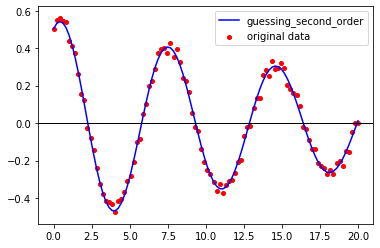

In [27]:
# to show the result of using the first order method.
t_array = np.linspace(0, 20 ,100)

plt.scatter(d_out[:, 0], d_out[:, 1], s = 16, color = 'r', label = 'original data')
plt.plot(t_array, true_motion(t_array, best_param_second_order[0], best_param_second_order[1], best_param_second_order[2], best_param_second_order[3], best_param_second_order[4] ), 'b',label = 'guessing_second_order')

plt.plot([-1, 21], [0, 0], 'black', linewidth = 1)
plt.xlim([-1, 21])
plt.legend()

d) Compare the speed perfomance of each function. Which one is faster? Which one has fewer calls to "true motion"?

## Comparative analysis between first order method & second order method
### Background
1. **Parameter initialization** 
We use the same initial values $[ 1, 0, 7, 3, 10]$ to assign values to the parameters in two different methods.
2. **Judgment convergence**
We record the current value every $100$ updates. When there are at least 5 recorded values, and the variance of the last $5$ recorded values is less than $0.01$, we think it has converged and stops the loop.

### comparative analysis
1. **We calculate the time between the two methods** 

2. **the number of iterations required for convergence**

The specific data is as follows：

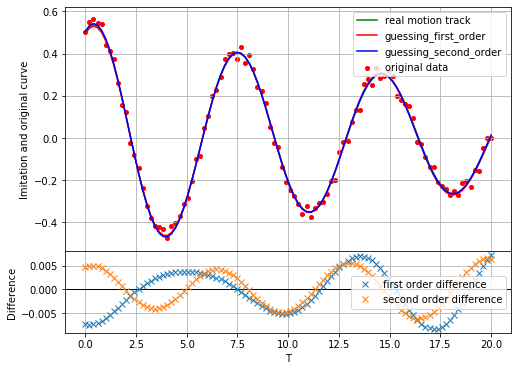

In [43]:
t_array = np.linspace(0, 20 ,100)
from matplotlib.gridspec import GridSpec
gs = GridSpec(4, 4)

true_motion_curve = true_motion(t_array, 0.5, 0, 8.25, 4.0, 10)
first_order_simulation = true_motion(t_array, best_param_first_order[0], best_param_first_order[1], best_param_first_order[2], best_param_first_order[3], best_param_first_order[4])
second_order_simulation = true_motion(t_array, best_param_second_order[0], best_param_second_order[1], best_param_second_order[2], best_param_second_order[3], best_param_second_order[4] )

fig = plt.figure(figsize=(8, 6))
plt.subplots_adjust(hspace=0)

ax1 = plt.subplot(gs[:3, :])
plt.scatter(d_out[:, 0], d_out[:, 1], s = 16, color = 'r', label = 'original data')

plt.plot(t_array, true_motion_curve, 'g', label = "real motion track")
plt.plot(t_array, first_order_simulation, 'r', label = 'guessing_first_order')
plt.plot(t_array, second_order_simulation, 'b', label = 'guessing_second_order')

plt.xlim([-1, 21])
plt.legend(loc = "best")
ax1.set_ylabel("Imitation and original curve")
ax1.grid()

ax2 = plt.subplot(gs[3,:], sharex = ax1)
ax2.set_xlabel("T"); ax2.set_ylabel("Difference")
plt.plot([-1, 21], [0, 0], 'black', linewidth = 1)
ax2.plot(t_array, first_order_simulation - true_motion_curve, "x", label = "first order difference")
ax2.plot(t_array, second_order_simulation - true_motion_curve, "x", label = "second order difference")
ax2.legend(loc = "best")
ax2.grid()

In [29]:
import time

In [42]:
start_time = time.clock()
min_chi_first_order , best_param_first_order = Gradient_descent_opt(initial_param)
end_time = time.clock()
print(end_time-start_time)

262.527758061 [ -0.07746005   0.           7.19046898   3.06895195  10.        ]
1.88357480429 [  0.47331943   0.           8.1180713    3.0988405   10.        ]
1.71438726012 [  0.47937232   0.           8.14784433   3.25921739  10.        ]
1.62222126147 [  0.47669642   0.           8.16254969   3.35561515  10.        ]
1.59508176816 [  0.49140513   0.           8.16731929   3.46248024  10.        ]
1.48921076351 [  0.48780293   0.           8.18217353   3.53868603  10.        ]
1.45018992742 [  0.48869191   0.           8.19516781   3.60009724  10.        ]
1.43585483308 [  0.488806     0.           8.20061833   3.62711818  10.        ]
1.40337031988 [  0.49273553   0.           8.21274696   3.70212435  10.        ]
1.38915590986 [  0.49078725   0.           8.23035531   3.75391703  10.        ]
1.37325622239 [  0.49447396   0.           8.23615215   3.78306612  10.        ]
1.38345937089 [  0.49231613   0.           8.23289149   3.75812414  10.        ]
1.38562395525 [  0.49854467 

In [31]:
start_time = time.clock()
min_chi_second_order , best_param_second_order = second_gradient_descent_opt(initial_param)
end_time = time.clock()
print(end_time-start_time)

369.40297461 [  0.99399216   0.           7.01623406   3.01857065  10.        ]
31.3486546671 [  0.65973347   0.           7.86312867   3.98449625  10.        ]
4.80442989681 [  0.55886961   0.           8.13690624   4.09004455  10.        ]
1.77725782681 [  0.52464521   0.           8.2353976    4.08627987  10.        ]
1.39462583253 [  0.51229745   0.           8.27022513   4.07963471  10.        ]
1.34440615603 [  0.50770475   0.           8.28221091   4.07480169  10.        ]
1.33758793118 [  0.50593628   0.           8.28603226   4.0707636   10.        ]
1.33653569209 [  0.50520692   0.           8.28694753   4.06714592  10.        ]
1.33627311909 [  0.50486443   0.           8.28684915   4.06385246  10.        ]
1.33613592869 [  0.50466987   0.           8.28641981   4.06084738  10.        ]
has already converged!
 1.33613592869 [  0.50466987   0.           8.28641981   4.06084738  10.        ]
23.300352000000004


## Summary 
Using first-order formula cost for 11.60 seconds and the second-order formula is used for 23.30 seconds, so the first-order formula dominates the time complexity. However, in the simulated result, we can find that the average deviation of the curve simulated by the second-order formula is smaller and superior in effect.

## Problem 4 - Simulated Annealing (15 Points)

(From Uros Seljak)

Optimal Reference: Newman, Computational Physics (p. 490-497)<br><br>

For a physical system in equilibrium at temperature $T$, the probability that at any moment the system is in a state $i$ is given by the Boltzmann probability. Let us assume our system has single unique ground state and let us choose our energy scale so that $E_i = 0$ in the ground state and $E_i > 0$ for all other states. Now suppose we cool down the system to absolute zero. The system will definitely be in the ground state, and consequently one way to find the ground state of the system is to cool it down to $T = 0$.
<br><br>
This in turn suggests a computational strategy for finding the ground state: let us simulate the system at temperature $T$, using the Markov chain Monte Carlo method, then lower the temperature to zero and the system should find its way to the ground state. This same approach could be used to find the minimum of any function, not just the energy of a physical system. we can take any mathematical function $f(x, y, z, ...)$ and treat the independent variables $x, y, z$ as defining a "state" of the system and $f$ as being the energy of that system, then perform a Monte Carlo simulation. Taking the temperature down to zero will again cause the system to fall into its ground state, i.e. the state with the lowest value of $f$, andhence we find the minimum of the function.
<br><br>
However, if the system is cooled rapidly, it can get stuck in a local energy minimum. On the other hand, an annealed system, one that is cooled sufficiently slowly, can find its way to the ground state. Simulated annleaing applies the same idea in a computational setting. It mimics the slow cooling of a material on the computer by using a Monte Carlo simulation with a temperature parameter that is gradually lowered from an initially high value towards zero. The initial temperature should be chosen so that the system equilibrates quickly. To achieve this, we should choose the thermal energy to be significantly greater than the typical energy change accompanying a single Monte Carlo move. 
<br><br>
As for the rate of cooling, one typically specifies a "cooling schedule," a trajectory for the temperature as a function of time, and the most common choice is the exponential one:
<br><br>
$$ T = T_0 e^{-t/\tau} $$
<br><br>
where $T_0$ is the initial temperature, and $\tau$ is a time constant. Some trial error may be necessary to find a good value for $\tau$. 
<br><br>
As an example of the use of simulated annealing, we will look at one of the most famous optimization problems, traveling salesman problem, which involves finding the shortest route that visits a given set of locations on a map. A salesman wishes to visit $N$ given cities, and we assume that he can travel in a straight line between any pair of citiies. Given the coordinates of the cities, the problem is to devise the shortest tour. It should start and end at the same city, and all cities must be visited at least once. Let us denote the position of the city $i$ by the two-dimensional vector $r_i = (x_i, y_i)$.
<br><br>
Here is the solution:


Populating the interactive namespace from numpy and matplotlib


/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['exp', 'sqrt', 'random']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


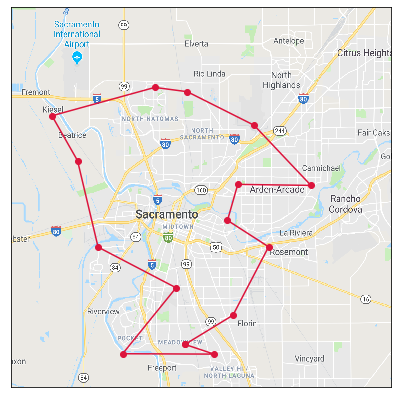

In [32]:
# Traveling salesman (Newman p. 493)
from math import sqrt, exp
from numpy import empty
from random import random,randrange
import matplotlib.image as mpimg

%pylab inline
N = 15
# R = 0.02
Tmax = 10.0
Tmin = 1e-4
tau = 1e4

# Function to calculate the magnitude of a vector
def mag(x):
    return sqrt(x[0]**2+x[1]**2)

# Function to calculate the total length of the tour
def distance():
    s = 0.0
    for i in range(N):
        s += mag(r[i+1]-r[i])
    return s

# Choose N city locations and calculate the initial distance
r = empty([N+1,2],float)
for i in range(N):
    r[i,0] = random.random()
    r[i,1] = random.random()
r[N] = r[0]
D = distance()

# Main loop
t = 0
T = Tmax
while T > Tmin:

    # Cooling
    t += 1
    T = Tmax*exp(-t/tau)

    # Choose two cities to swap and make sure they are distinct
    i,j = randrange(1,N), randrange(1,N)
    while i == j:
        i,j = randrange(1,N),randrange(1,N)

    # Swap them and calculate the change in distance
    oldD = D
    r[i,0],r[j,0] = r[j,0],r[i,0]
    r[i,1],r[j,1] = r[j,1],r[i,1]
    D = distance()
    deltaD = D - oldD

    # If the move is rejected, swap them back again
    if random.random()>exp(-deltaD/T):
        r[i,0],r[j,0] = r[j,0],r[i,0]
        r[i,1],r[j,1] = r[j,1],r[i,1]
        D = oldD

plt.figure(figsize = (8, 7))

img = mpimg.imread("map_sacramento.png")
plt.plot(r[:,0], r[:,1], 'o-', color = 'crimson', zorder=1)
plt.imshow(img,zorder=0, extent=[-0.1, 1.1, -0.1, 1.1])
plt.xticks([])
plt.yticks([])
plt.show()

Now, consider the function $f(x) = x^2 − \mathrm{cos}(4\pi x)$, which looks like this:

Populating the interactive namespace from numpy and matplotlib


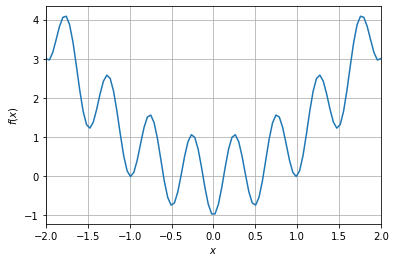

In [44]:
%pylab inline
x = np.linspace(-2, 2, 100)
y = x**2 - np.cos(4*np.pi*x)
plt.plot(x, y)
plt.grid(True); plt.xlim(-2, 2); plt.xlabel('$x$'); plt.ylabel('$f(x)$')
plt.show()

Clearly the global minimum of this function is at $x = 0$.

a) Write a program to confirm this fact using simulated annealing starting at, say, $x = 2$, with Monte Carlo moves of the form $x \rightarrow x + \delta$ where $\delta$ is a random number drawn from a Gaussian distribution with mean zero and standard deviation one. Use an exponential cooling schedule and adjust the start and end temperatures, as well as the exponential constant, until you find values that give good answers in reasonable time. Have your program make a plot of the values of $x$ as a function of time during the run and have it print out the final value of x at the end. You will find the plot easier to interpret if you make it using dots rather than lines, with a statement of the form plot(x,".") or similar.

In [45]:
# Hyperparametric definition
# T_min = 1e-4
# T_max = 10
# tau = 1e4
def function_one(x):
    return x**2 - np.cos(4*np.pi*x)

In [46]:
def simulated_annealing(func, Start = 2, lower_bound = -100, upper_bound = 100,T_min = 1e-4, T_max = 10,tau = 1e4):
    T_now = T_max; t = 0; point = Start 
    point_list = [Start]
    
#     fig = plt.figure(figsize=(6, 6))
    
    # main loop
    while(T_now > T_min):
        # cool down
        t += 1
        T_now = T_max * np.e ** (-t / tau) 
        # record the value before change.
        pre_value = func(point)
        # change 
        delta = random.normal(0.0, 1.0)
        while(point + delta >= upper_bound or point + delta <= lower_bound):
            delta = random.normal(0.0, 1.0)
        
        point += delta
        
        cur_value = func(point)
        # if rejected change the point back.
        if(random.random() > exp((pre_value - cur_value) / T_now)):
            point -= delta
        else:
            point_list.append(point)
    fig = plt.figure(figsize=(12, 8))
    # to be more 
    color_seed = (20 * np.random.rand(1000))**2  
    plt.title("Evolutionary process")
    plt.plot(np.arange(1, len(point_list) + 1, 1), point_list, 'b.', ms=1, label = "selected point")
    plt.legend()
    return np.array(point_list)

In [ ]:
# tau_list = np.logspace(2, 4, 3, base = 10)
# ans_list = [function_one(simulated_annealing(function_one, tau=n)[-1]) for n in tau_list]

[  2.00000000e+00   1.58690138e+00   1.58427687e+00 ...,  -7.62511566e-04
  -1.07103920e-03  -9.47103721e-04]


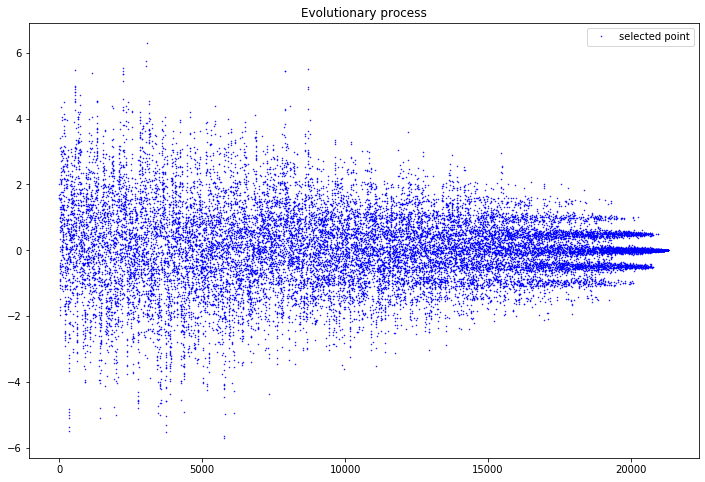

In [47]:
print(simulated_annealing(function_one))

b. Now adapt your program to find the minimum of the more complicated function $f(x) = \mathrm{cos}(x) + \mathrm{cos}(\sqrt{2}x) + \mathrm{cos}(\sqrt{3}x)$ in the range $0 < x < 50$. </i></span><br><br>
(Hint: The correct answer is around $x = 16$, but there are also competing minima around $x = 2$ and $x = 42$ that your program might find. In real-world situations, it is often good enough to find any reasonable solution to a problem, not necessarily the absolute best, so the fact that the program sometimes settles on these other solutions is not necessarily a bad thing.)

In [48]:
def function_two(x):
    return cos(x) + cos(sqrt(2)*x) + cos(sqrt(3)*x)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


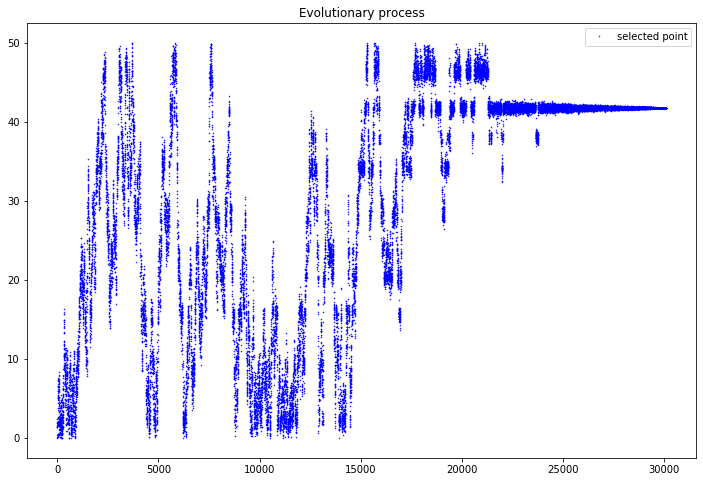

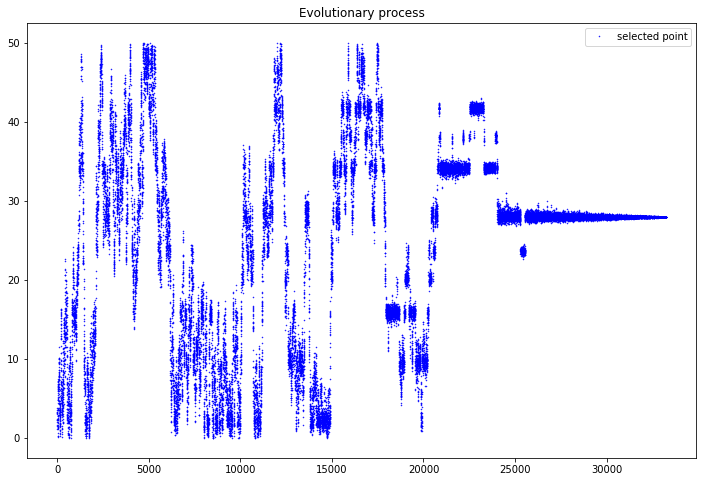

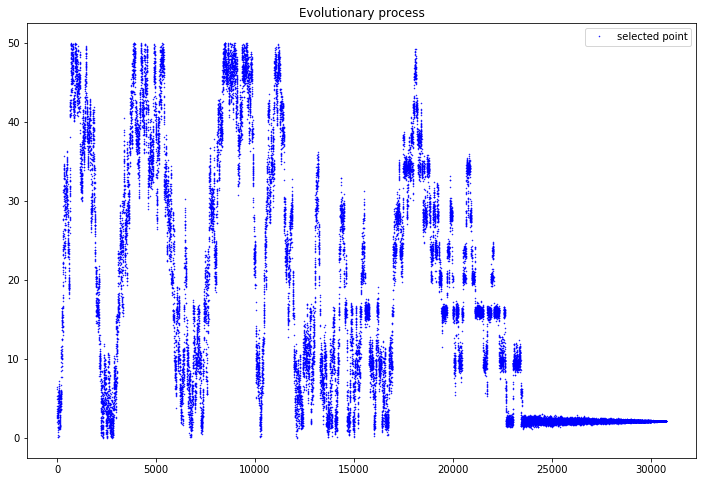

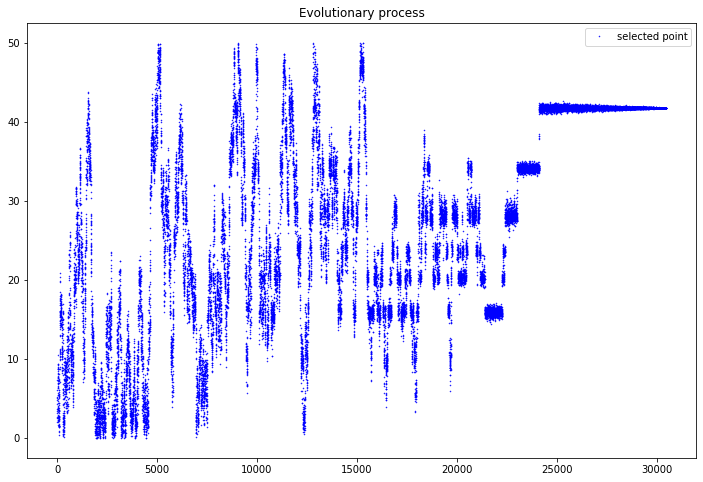

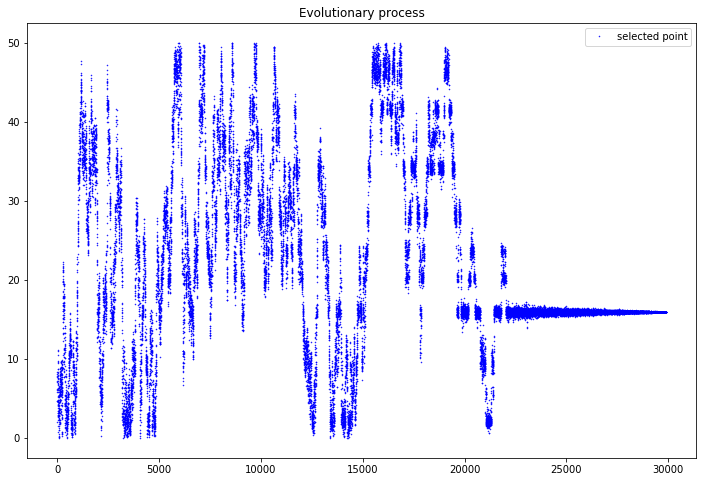

...

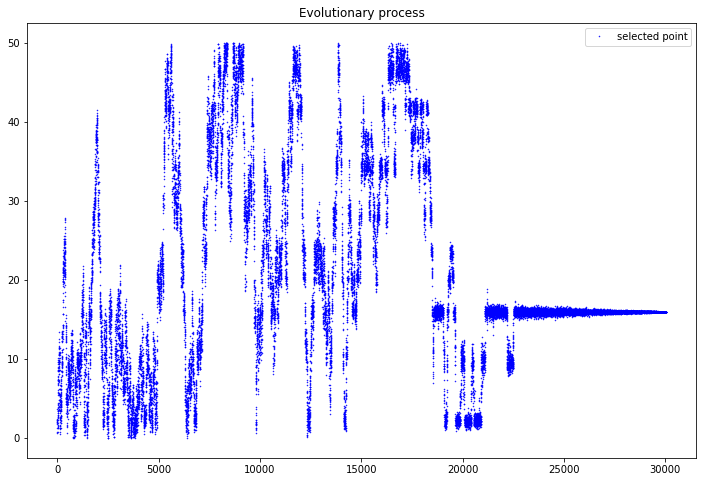

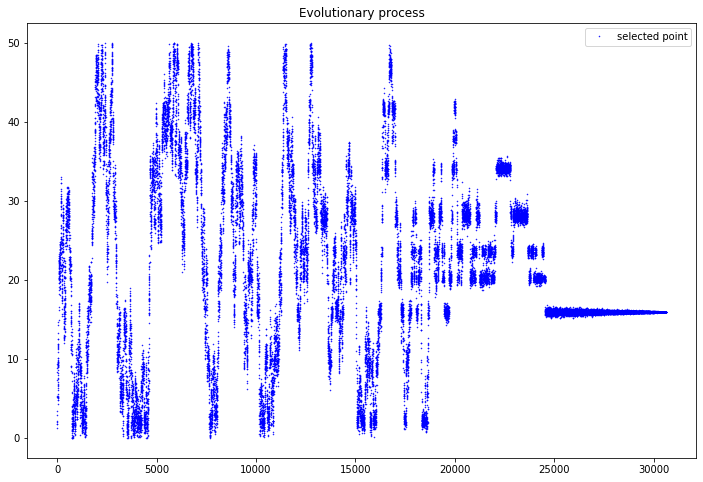

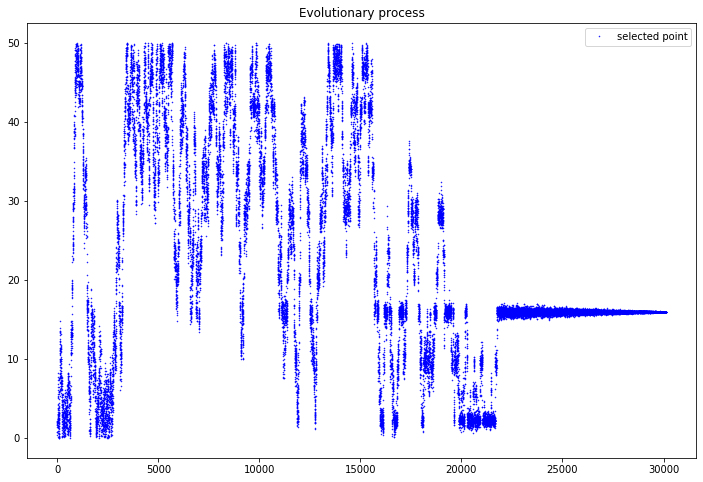

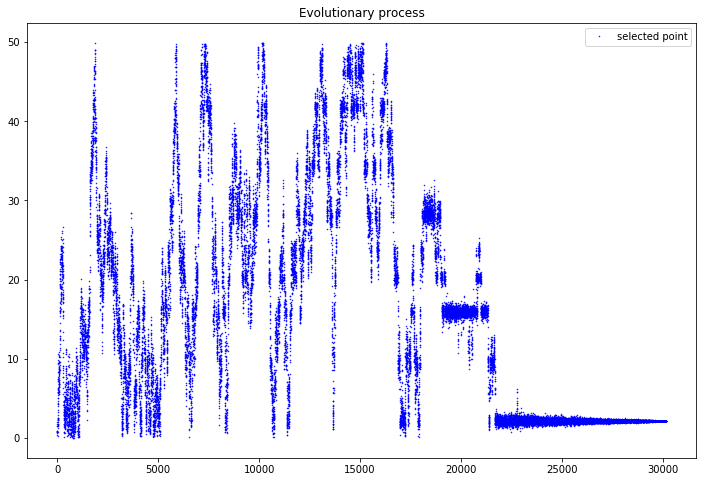

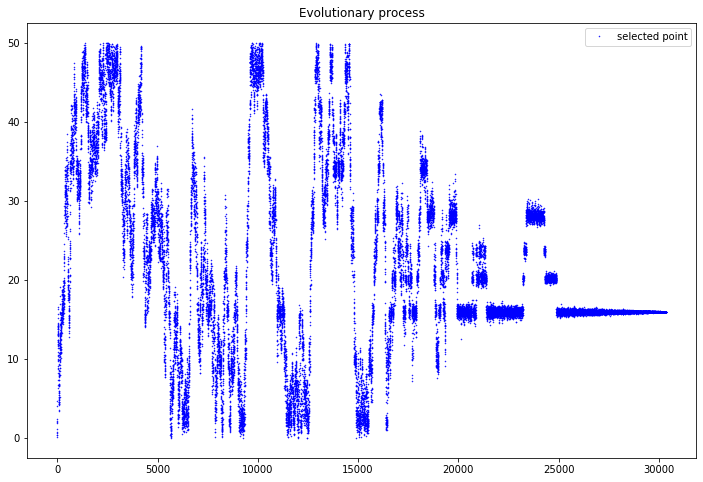

In [49]:
best_choice_list = np.array([simulated_annealing(function_two, lower_bound = 0, upper_bound=50)[-1] for i in range(100)])

([<matplotlib.patches.Wedge at 0x1bf8c3ac8>,
 [Text(-0.5894094953465412, 0.928760704807937, '2'),
  Text(-0.8485281374238572, -0.848528137423857, '16'),
  Text(0.8251221330042983, -0.7274431012982646, '34'),
  Text(0.9801072140121815, 0.49938947630209435, '42'),
  Text(0.1720779903783871, 1.0864571621685486, 'else')],
 [Text(-0.32149608837084065, 0.5065967480770565, '18.0%'),
  Text(-0.4949747468305834, -0.4949747468305832, '39.0%'),
  Text(0.45006661800234443, -0.39678714616268973, '13.0%'),
  Text(0.5346039349157353, 0.27239425980114235, '25.0%'),
  Text(0.09386072202457478, 0.592612997546481, '5.0%')])

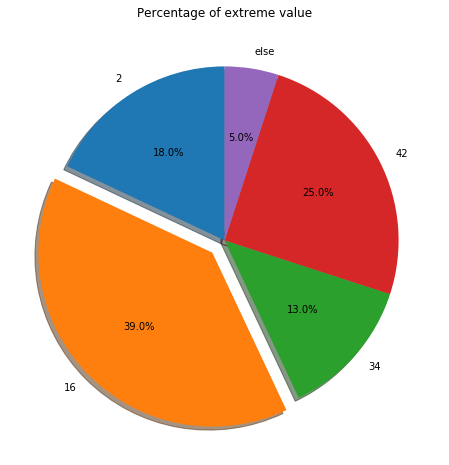

In [50]:
# Use a pie chart to represent the distribution of results

fig = plt.figure(figsize = (8, 8))

partition_around_2 = np.mean(abs(best_choice_list - 2) < 0.5)
partition_around_16 = np.mean(abs(best_choice_list - 16) < 0.5)
partition_around_34 = np.mean(abs(best_choice_list - 34) < 0.5)
partition_around_42 = np.mean(abs(best_choice_list - 42) < 0.5)

partition_around_else = 1 - partition_around_34 - partition_around_16 - partition_around_42 - partition_around_2

labels = "2", "16", "34", "42", "else"
plt.title("Percentage of extreme value")
plt.pie([partition_around_2, partition_around_16, partition_around_34, partition_around_42, partition_around_else]
       , (0, 0.1, 0, 0, 0), labels = labels, autopct='%1.1f%%', shadow=True, startangle=90)